In [119]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import math

In [120]:
# Set up paths
SCRIPT_DIR_PATH = os.getcwd()
PROJECT_DIR_PATH = os.path.dirname(SCRIPT_DIR_PATH)
MODEL_DIR_PATH = os.path.join(PROJECT_DIR_PATH, 'model')
OUTPUTS_DIR_PATH = os.path.join(MODEL_DIR_PATH, 'outputs')
BASELINE_DIR_PATH = os.path.join(OUTPUTS_DIR_PATH, 'baseline')
ENSEMBLE_DIR_PATH = os.path.join(OUTPUTS_DIR_PATH, 'ensemble')
EXP_DESIGN_DIR_PATH = os.path.join(OUTPUTS_DIR_PATH, 'exp_design')
CONFIG_DIR_PATH = os.path.join(MODEL_DIR_PATH, 'python_ver/config')
SINGLE_SIM_DIR_PATH = os.path.join(OUTPUTS_DIR_PATH, 'single_sim')

In [121]:
def simple_line_plot(df, x, y, title, xlabel, ylabel):
    fig, ax = plt.subplots()
    df.plot(x=x, y=y, ax=ax)
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    plt.grid(True)
    plt.show()
    plt.close()
   
    return None

In [122]:
import yaml
config_yaml_path = os.path.join(CONFIG_DIR_PATH, 'ensemble_config_6.yaml')

# Read the ensemble configuration file
with open(config_yaml_path, 'r') as file:
    config = yaml.safe_load(file)
# Extract the parameters from the configuration
model_parameters = config['model_parameters']
parameter_keys = list(model_parameters.keys())
parameter_keys


['k_SI',
 'ef_AC',
 'alpha_sat',
 'k_use',
 'k_coll_SI',
 'eps_SI_SC',
 'k_SC_decay',
 'k_coll_SC',
 'k_AC_growth',
 'k_AC_decay']

In [123]:
model_parameters

{'k_SI': 0.03,
 'ef_AC': 0.005,
 'alpha_sat': 0.2,
 'k_use': 0.02,
 'k_coll_SI': 0.02,
 'eps_SI_SC': 0.05,
 'k_SC_decay': 0.02,
 'k_coll_SC': 0.05,
 'k_AC_growth': 0.03,
 'k_AC_decay': 0.01}

## Baseline Plots

In [124]:
baseline_df = pd.read_csv(os.path.join(BASELINE_DIR_PATH, 'baseline_config_6_output.csv'))
baseline_df.head()

,time,State_Inputs,State_Capacity,Administrative_Complexity
0,0.00,1.000000,0.5000,0.050000
1,0.01,1.000102,0.5004,0.050145
2,0.02,1.000205,0.5008,0.050290
3,0.03,1.000307,0.5012,0.050435
4,0.04,1.000410,0.5016,0.050581


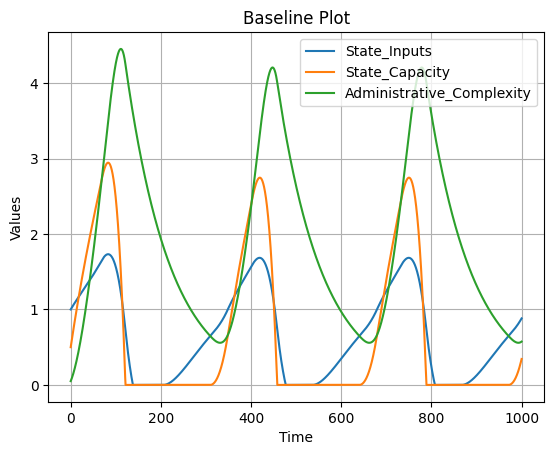

In [125]:
# state_variables = ["State_Inputs", "State_Capacity", "Administrative_Complexity", "State_Integrity", "Population"]
state_variables = ["State_Inputs", "State_Capacity", "Administrative_Complexity"]

# Plot the data
simple_line_plot(baseline_df, 'time', state_variables, 'Baseline Plot', 'Time', 'Values')

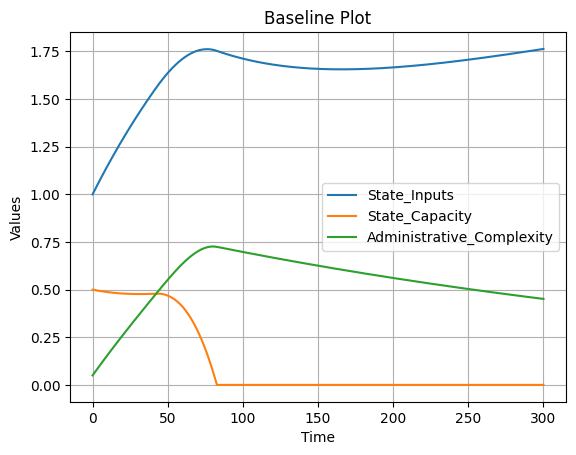

In [126]:
single_sim_df = pd.read_csv(os.path.join(SINGLE_SIM_DIR_PATH, 'run_sim_6_simulation_output.csv'))
# Plot the data
simple_line_plot(single_sim_df, 'time', state_variables, 'Baseline Plot', 'Time', 'Values')

## Ensemble

In [127]:
output_df = pd.read_csv(os.path.join(ENSEMBLE_DIR_PATH, 'ensemble_config_6_output.csv'))
output_df.head()

,State_Inputs,State_Capacity,Administrative_Complexity,time,run_id
0,1.000000,0.500000,0.050000,0.0,1.0
1,1.003153,0.504651,0.052478,0.2,1.0
2,1.006298,0.509302,0.054974,0.4,1.0
3,1.009432,0.513951,0.057487,0.6,1.0
4,1.012558,0.518599,0.060018,0.8,1.0


In [128]:
output_df

,State_Inputs,State_Capacity,Administrative_Complexity,time,run_id
0,1.000000,0.500000,0.050000,0.0,1.0
1,1.003153,0.504651,0.052478,0.2,1.0
2,1.006298,0.509302,0.054974,0.4,1.0
3,1.009432,0.513951,0.057487,0.6,1.0
4,1.012558,0.518599,0.060018,0.8,1.0
...,...,...,...,...,...
150095,0.904672,0.062055,0.780273,299.2,100.0
150096,0.906925,0.064923,0.779135,299.4,100.0
150097,0.909185,0.067861,0.778025,299.6,100.0
150098,0.911451,0.070870,0.776942,299.8,100.0


In [129]:
# Load experiment data
exp_design_df = pd.read_csv(os.path.join(EXP_DESIGN_DIR_PATH, 'exp_design_ensemble_config_6_output.csv'))
exp_design_df.head()

,k_SI_X,ef_AC_X,alpha_sat_X,k_use_X,k_coll_SI_X,eps_SI_SC_X,k_SC_decay_X,k_coll_SC_X,k_AC_growth_X,k_AC_decay_X,run_id
0,1.089034,0.572748,0.841673,0.851246,1.364154,0.720654,1.277367,0.934866,0.867729,1.333315,1
1,0.602041,1.227121,0.958729,1.231854,0.920985,1.195829,1.456498,0.697978,1.011097,1.452719,2
2,0.748542,1.067632,0.601201,0.580979,0.981124,0.693654,0.824236,1.095745,0.978815,0.565192,3
3,1.221653,0.926684,0.650304,1.153981,1.288040,0.753542,1.193196,0.523706,0.706828,1.448715,4
4,0.590652,0.776519,1.412834,0.912873,0.801947,1.383423,1.089691,0.815553,0.628652,0.595292,5


In [130]:
factor_columns = [col for col in exp_design_df.columns if col.endswith('_X')]
factor_columns

['k_SI_X',
 'ef_AC_X',
 'alpha_sat_X',
 'k_use_X',
 'k_coll_SI_X',
 'eps_SI_SC_X',
 'k_SC_decay_X',
 'k_coll_SC_X',
 'k_AC_growth_X',
 'k_AC_decay_X']

In [131]:
def get_run_scalers(exp_design_df, run_id):
  
    row = exp_design_df[exp_design_df['run_id'] == run_id]
    if row.empty:
        raise ValueError(f"run_id {run_id} not found in exp_design_df")
    # Drop the 'run_id' column and convert to dict
    scalers = row.drop(columns=['run_id']).iloc[0].to_dict()
    return scalers

def get_scaled_parameters(exp_design_df, run_id, model_parameters, factor_names):
    scalers = get_run_scalers(exp_design_df, run_id)
    # Multiply each parameter by its scaler
    scaled_parameters = {k[0]: model_parameters[k[0]] * scalers[k[1]] for k in zip(model_parameters.keys(), factor_names)}
    return scaled_parameters


get_scaled_parameters(exp_design_df, 7, model_parameters, factor_columns)

{'k_SI': 0.040590208862695834,
 'ef_AC': 0.004798759638300764,
 'alpha_sat': 0.2115720719831507,
 'k_use': 0.020029280331475132,
 'k_coll_SI': 0.02701040832955537,
 'eps_SI_SC': 0.028201199923894877,
 'k_SC_decay': 0.019642599763360122,
 'k_coll_SC': 0.07149570942741117,
 'k_AC_growth': 0.03722804778443561,
 'k_AC_decay': 0.0071754500758487}

In [132]:
# # Create a figure and axis
# fig, ax = plt.subplots(figsize=(10, 6))

# # Define the columns to plot
# columns_to_plot = ["State_Inputs", "State_Capacity", "Administrative_Complexity"]

# # Loop through each unique 'run_id'
# for run_id in output_df['run_id'].unique():
#     subset = output_df[output_df['run_id'] == run_id]
#     for column in columns_to_plot:
#         ax.plot(subset['time'], subset[column], label=f'{column} Run ID {run_id}')

# # Adding plot title and labels
# ax.set_title('Time Series Data for All Run IDs')
# ax.set_xlabel('Time')
# ax.set_ylabel('Values')
# ax.grid(True)

# # Show the plot
# plt.show()

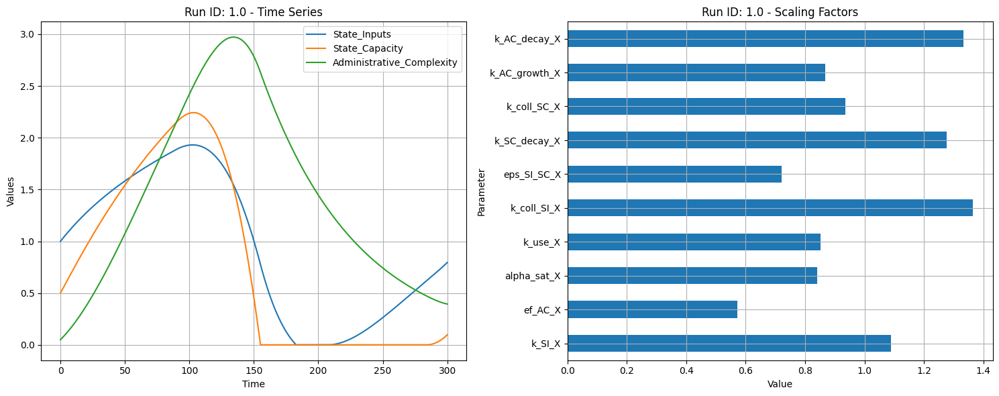

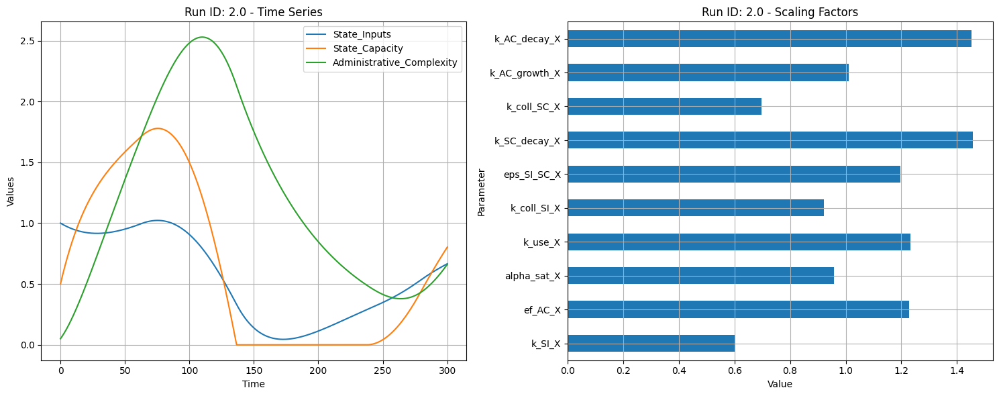

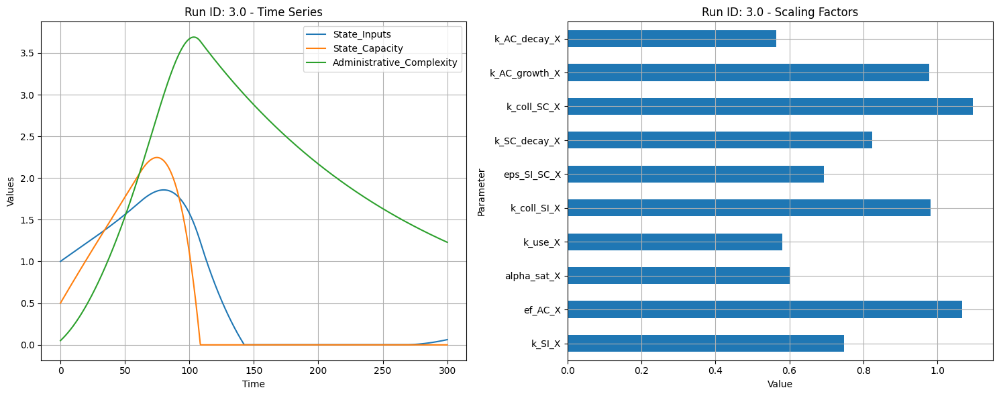

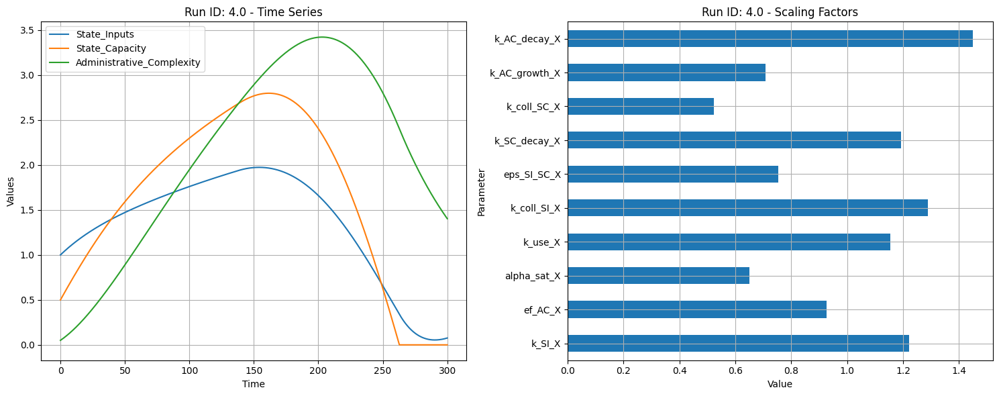

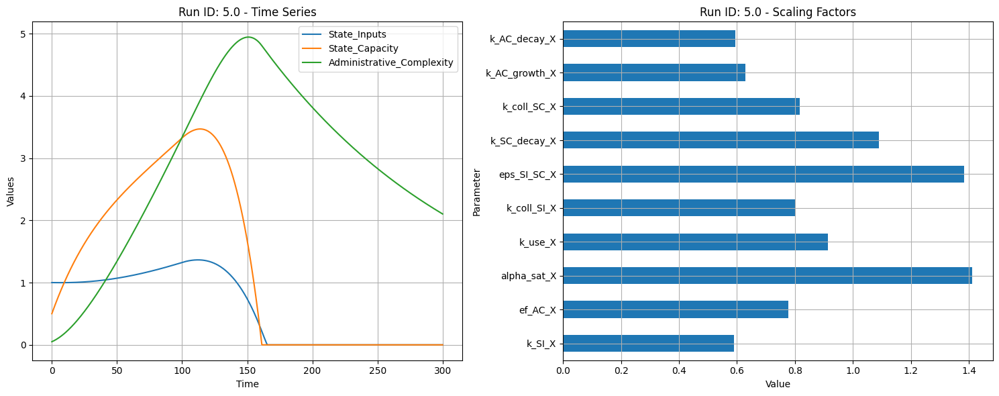

...

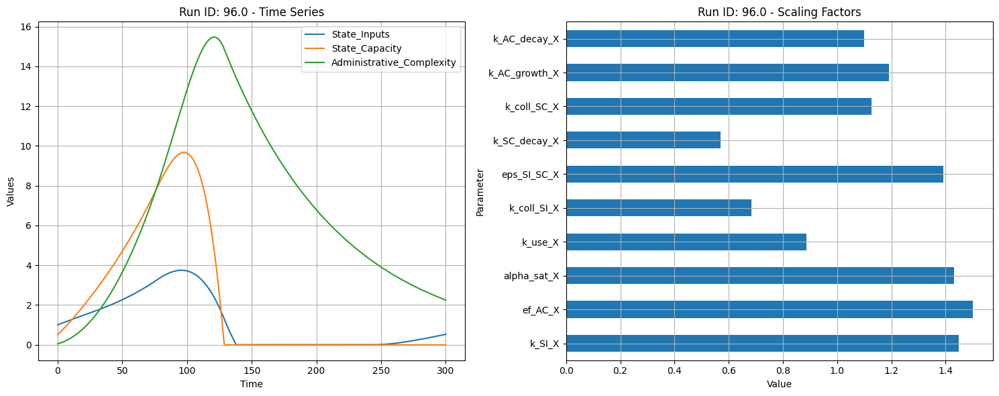

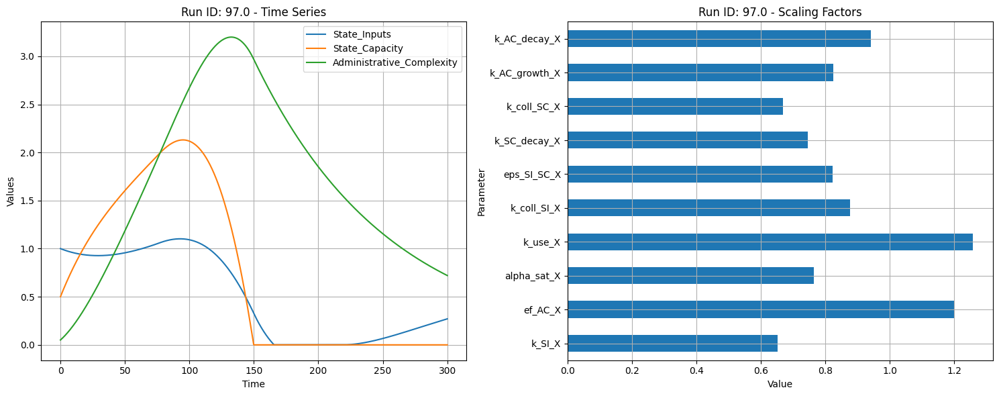

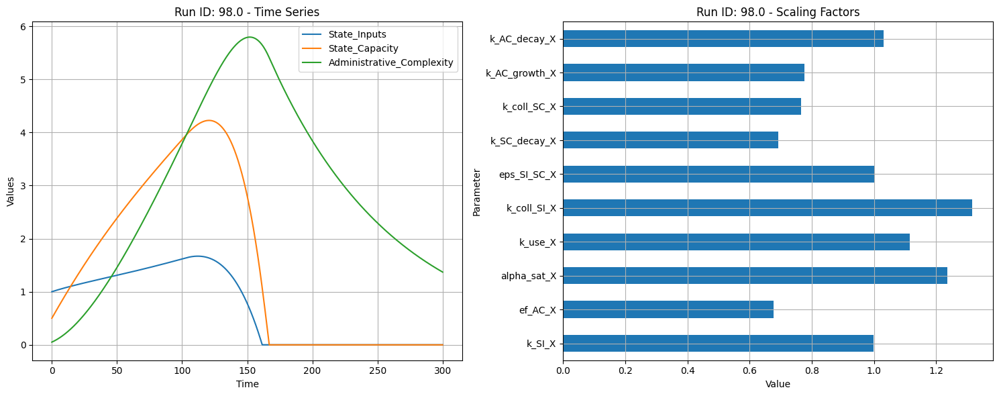

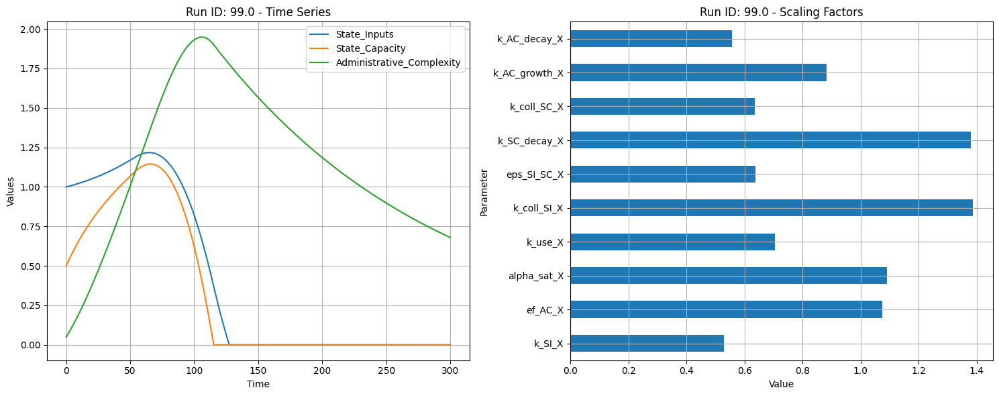

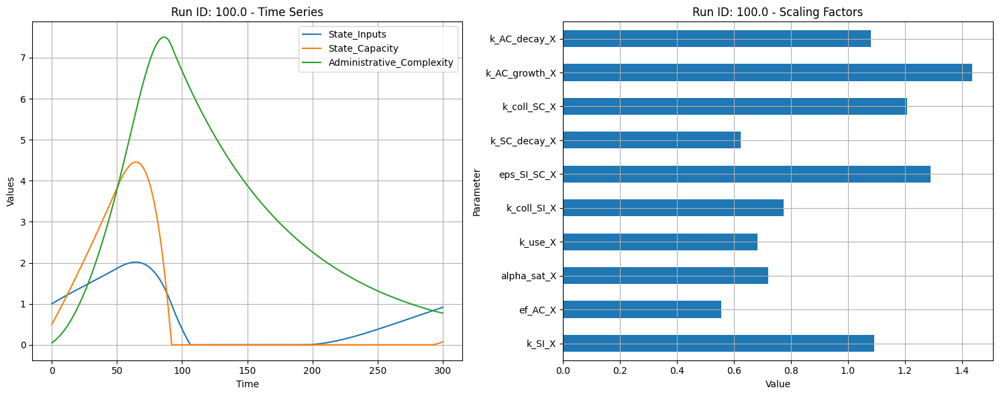

In [133]:
# Define the columns you want to plot.
stocks_to_plot = ["State_Inputs", "State_Capacity", "Administrative_Complexity"]

# Loop over each run_id and create one figure with two subplots.
for run_id in output_df['run_id'].unique():
    subset_output = output_df[output_df['run_id'] == run_id]
    subset_exp_design = exp_design_df[exp_design_df['run_id'] == run_id]
    
    # Create a figure with 1 row and 2 columns of subplots.
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    # Time series plot on the left subplot.
    subset_output.plot(x='time', y=stocks_to_plot, ax=ax1, title=f'Run ID: {run_id} - Time Series')
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Values')
    ax1.legend()
    ax1.grid(True)
    
    # Horizontal bar plot on the right subplot.
    # Use the first row of exp_design data for this run_id.
    data_bar = subset_exp_design[factor_columns].iloc[0]
    data_bar.plot(kind='barh', ax=ax2, title=f'Run ID: {run_id} - Scaling Factors')
    ax2.set_xlabel('Value')
    ax2.set_ylabel('Parameter')
    ax2.grid(True)
    
    
    # Add labels to each bar with the actual value.
    # Compute an offset relative to the maximum value so the text doesn't overlap the bar.
    # offset = data_bar.max() * 0.01  
    # for patch in ax2.patches:
    #     ax2.text(patch.get_width() + offset, 
    #              patch.get_y() + patch.get_height() / 2,
    #              f'{patch.get_width():.4f}', 
    #              ha='left', va='center', fontsize=8)
    
    plt.tight_layout()
    plt.show()


In [134]:
# for run_id in output_df['run_id'].unique():
#     subset = output_df[output_df['run_id'] == run_id]
#     subset.plot(x='time', y=columns_to_plot, figsize=(10, 6), title=f'Run ID: {run_id}')
#     plt.xlabel('Time')
#     plt.ylabel('Values')
#     plt.legend()
#     plt.grid(True)
#     plt.show()


In [135]:
# for run_id in output_df['run_id'].unique():
#     subset = output_df[(output_df['run_id'] == run_id) & (output_df['time'] < 10)]
#     subset.plot(x='time', y=columns_to_plot, figsize=(10, 6), title=f'Run ID: {run_id}')
#     plt.xlabel('Time')
#     plt.ylabel('Values')
#     plt.legend()
#     plt.grid(True)
#     plt.show()
